# House Price Prediciton Using Machine Learning Models
---
1. Exploratory Data Analysis
    - Feature Engineering
    - Initial Feature Selection
    - Dealing with Data 'Missingness'
2. Linear Assumptions Check
    - Checking the 5 Linear Assumptions to ensure it can be used for MLR models
3. Modeling
    - Models
        - Lasso
        - Ridge
        - Elastic-Net
        - Random Forest
    - Hyperparameter Tuning
---

### Libraries

- Installing the necessary libraries that are used throughout this notebook/project.
- Setting random seed for reproducibility.

In [23]:
# Libraries #

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_squared_error

import scipy
from scipy.stats import skew
from scipy.stats import kurtosis
from statsmodels.graphics.gofplots import qqplot

pd.set_option('display.max_columns', None)

np.random.seed(2)

### Loading Datasets
- Two Datasets imported from downloads
    - Originally from Kaggle Competition
    - Training Set - to train the models
    - Testing Set - to test the models performance after they are trained

In [3]:
# Datasets #

houses_train = pd.read_csv("C:/Users/teste/Downloads/house-prices-advanced-regression-techniques/train.csv")

houses_test = pd.read_csv("C:/Users/teste/Downloads/house-prices-advanced-regression-techniques/test.csv")

---
# 1. Exploratory Data Analysis

---
### Dataset Features

In [4]:
# Train Column Names #

houses_train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [7]:
# Test Column Names #

houses_test.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

### First Look at Columns:

- Data has a lot of columns = many inputs for MLR models -> Lasso potentially a good model due to feature reduction
- Need to see what columns I can identify as non-important (how many houses actually have pools?)
- Need to see what columns have missing data (Porchs, Fences, Pools, MiscFeature?)
- Need to look for columns to combine (anything with SF or Area)
- Need to drop ID and Sale Price before modeling (ID is not a real feature and Sale Price is the exact output/y^)

---
### Checking DF Rows and Shape

In [6]:
# DF Shape #

print(houses_train.shape)
print(houses_test.shape)

(1460, 81)
(1459, 80)


- Test DF has one less row (has one less observation/house?)
- Test DF is also missing the feature Sale Price
    - Part of a competition so that makes sense

In [5]:
# Looking at top 30 observations #

houses_train.head(30)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NaN,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,Gas

- Data has some features with many NaN values - need to fill in or remove entirely if will not provide enough data for model learning (ex. Alley Feature - probably very few houses with Alleys - likely will remove)

In [8]:
# Total Number of Actual Values in Alley Column #

houses_train['Alley'].notna().sum()

91

In [10]:
# Total Number of NaN/Na Values in Alley Column #

houses_train['Alley'].isna().sum()

1369

---
### One-Hot Encoding

- Looking at the amount of numerical versus categorical columns
- Need to dummify the categorical columns so they can be used for MLR modeling (cannot use words, needs to be numbers)
- Dummification will add MANY more features but hopefully not make it too highly dimensional

In [15]:
# Numerical Column Count #

numerical_columns = houses_train.select_dtypes(include=['number']).columns.tolist()

len(numerical_columns)

38

In [16]:
# Categorical Column Count #

categorical_columns = houses_train.select_dtypes(include=['object', 'category']).columns.tolist()

len(categorical_columns)

43

In [19]:
# One-Hot Encoding the Categorical Columns #

houses_encoded = pd.get_dummies(houses_train, columns=categorical_columns, drop_first=True)

# can use drop_first attritube in get_dummies command to drop firt column of dummied vars, helps with multicollinearity

print(houses_encoded.shape)  # checking dimensions

houses_encoded.head(3) # checking DF and new columns

(1460, 247)


,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,PoolQC_Fa,PoolQC_Gd,Fence_GdWo,Fence_MnPrv,Fence_MnWw,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,1,60,65.0,8450,7,5,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,208500,0,0,1,0,1,0,0,0,1,

---
### Dropping ID & SalePrice

In [20]:
# Dropping ID Column #

houses_encoded = houses_encoded.drop(columns='Id')

In [21]:
# Making Sale Price Target #

houses_sale = houses_train['SalePrice'] # target feature/output variable

houses_train['SalePrice'] = np.log(houses_train['SalePrice']) # adding log transformation here

houses_target = houses_train['SalePrice']

print(houses_target)

# will drop SalePrice out of DF later

0       12.247694
1       12.109011
2       12.317167
3       11.849398
4       12.429216
          ...    
1455    12.072541
1456    12.254863
1457    12.493130
1458    11.864462
1459    11.901583
Name: SalePrice, Length: 1460, dtype: float64


In [22]:
# Filling in NaN Values #

houses_encoded.fillna(0, inplace=True)

# just filling in NaN values with 0's for now to signify the feature is missing/not in that observation

---
## Sale Price Transformation
- Log Transforming SalePrice feature to make it more normally distributed
    - Also compresses the range - original Sale Price feature had a large range

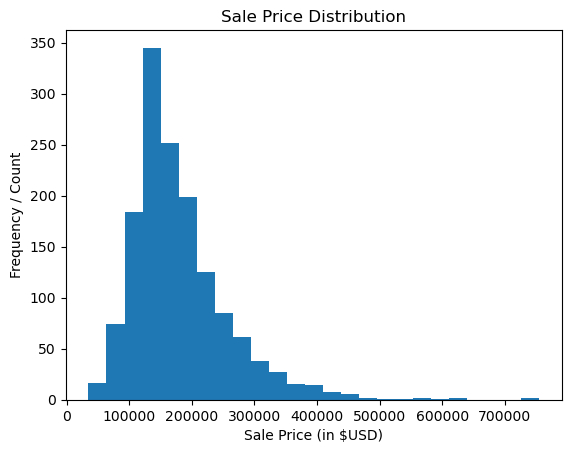

In [35]:
# Plotting Sale Price as a Histogram to See Distribution #

plt.hist(houses_sale, bins=25) # changed bins to 25 to see skew better

# Graph Labels
plt.title('Sale Price Distribution')
plt.xlabel('Sale Price (in $USD)')
plt.ylabel('Frequency / Count')

# Showing Histo
plt.show()

In [36]:
# Skew and Kurtosis Calculations #

print(skew(houses_sale, axis=0, bias=True))
print(kurtosis(houses_sale, axis=0, bias=True))

1.880940746034036
6.509812011089439


#### Sale Price Distribution
- Strong right skew, possible outlier values moving the mean towards the right side of the dsitribution
- Kurotsis value is positive and large = Leptokurtic -> extreme values in the tail of the data

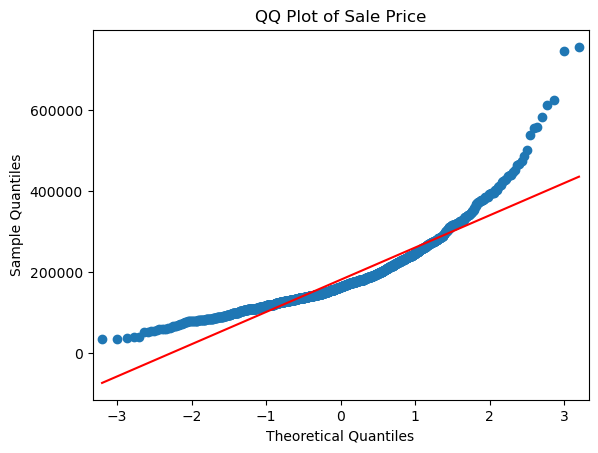

In [19]:
# QQ Plot of SalePrice #

qqplot(houses_sale, line='s')

# Labels
plt.title("QQ Plot of Sale Price")

# Show Plot
plt.show()

# just using as another check of normality

### Log-Transformation
- Sale Price was log-transformed in previous section
- Used np.log on entire column
- Plotting below to check new dist.

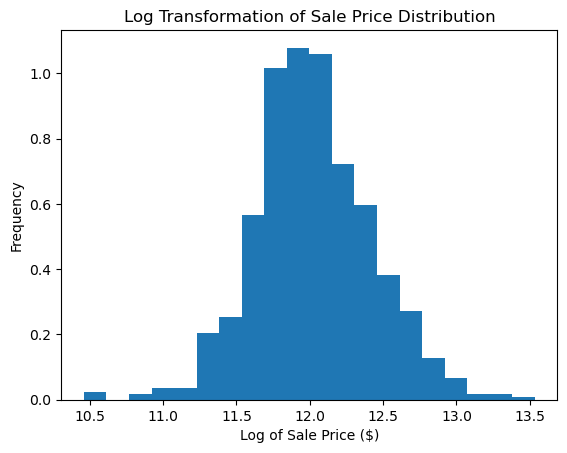

In [37]:
# Log-Transformed Sale Price #

plt.hist(houses_target, bins=20, density=True) # histogram of new target

# Labels
plt.title('Log Transformation of Sale Price Distribution')
plt.xlabel('Log of Sale Price ($)')
plt.ylabel('Frequency')

# Plotting
plt.show()

In [21]:
# Skew and Kurtosis Calculations #

print(skew(houses_target, axis=0, bias=True))
print(kurtosis(houses_target, axis=0, bias=True))

0.1212103673013655
0.8026555069117713


### New Distribution

- Data looks more normal after the log-transformation
- Range also looks better, outliers compressed via logging
- Skew and Kurtosis both closer to 0 = normal dist. value

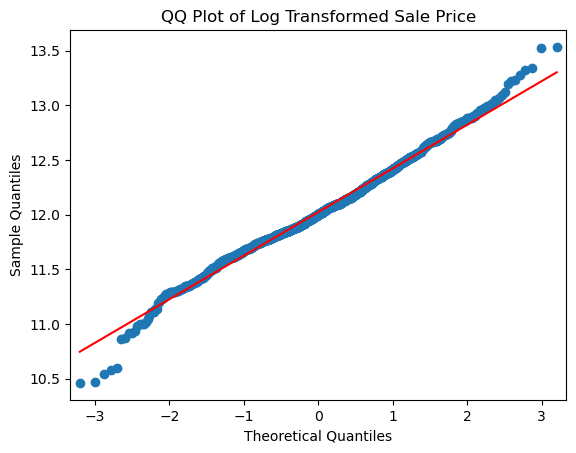

In [38]:
# Checking QQPlot for New Distribution #


qqplot(houses_target, line='s')

# Labels
plt.title("QQ Plot of Log Transformed Sale Price")

# Showing Plot
plt.show()

---

### Looking at Double Log QQ Plot
- Just looking at this for fun
- Likely not going to use / is not standard practice

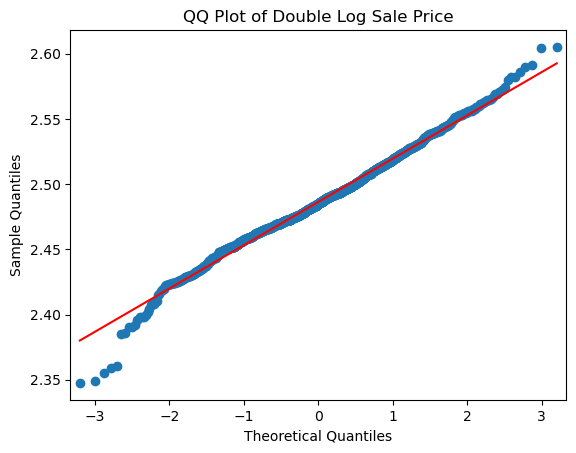

In [41]:
# Checking QQPlot for New Distribution #


qqplot(np.log(houses_target), line='s')

# Labels
plt.title("QQ Plot of Double Log Sale Price")

# Showing Plot
plt.show()

### Double Log-Transformation Conclusions
- Double log looks very slightly better but probably not needed
- Makes the target much harder to interpret
- Sticking to single log-transformation

---
## Feature Engineering

In [50]:
# Checking Encoded DF #

houses_encoded.head(15)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,PoolQC_Fa,PoolQC_Gd,Fence_GdWo,Fence_MnPrv,Fence_MnWw,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,60,65.0,8450,7,5,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,208500,0,0,1,0,1,0,0,0,1,0,0,1

In [43]:
# Making a Copy to Test Changes #

houses_encoded_engi = houses_train.copy()

# Copy will have engineered features compared to original set to compare effect of Feature Engineering on Model Performance

In [44]:
# Checking Encoded DF Copy #

houses_encoded_engi

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,12.247694
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,12.109011
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,12.317167
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,11.849398
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,12.429216
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,12.072541
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,12.254863
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,12.493130
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,Mn,GL

### Addressing Missing Values

In [49]:
# Missing Values #

missing_values = houses_encoded_engi.isna().sum().sort_values(ascending = False) 

print(missing_values)

# summing missing/NaN values and sorting values by descending order

PoolQC         1453
MiscFeature    1406
Alley          1369
Fence          1179
FireplaceQu     690
               ... 
ExterQual         0
Exterior2nd       0
Exterior1st       0
RoofMatl          0
SalePrice         0
Length: 81, dtype: int64


### Dealing with 'Missingness' in Some Features
- Removing the columns/features with a lot of missing values
    - Pool QC
    - MiscFeature
    - Alley
- Not enough data for the models to learn from

In [52]:
# Dropping the Columns #

cols_with_missingness = ['PoolQC', 'MiscFeature','Alley']

houses_encoded_engi = houses_encoded_engi.drop(cols_with_missingness, axis =1)

In [30]:
# Looking at Categorical Columns #

categorical_columns_engi = houses_encoded_engi.select_dtypes(include=['object', 'category']).columns.tolist()

# one-hot encoding the cat cols

In [31]:
# Dummification #

houses_encoded_engi = pd.get_dummies(houses_encoded_engi, columns=categorical_columns_engi, drop_first=True)

### Dealing with Multicollinearity

In [32]:
# Columns with High Multicollinearity #

cols_with_multicolin = ['TotalBsmtSF','TotRmsAbvGrd', 'GarageCars', 'MSZoning_RL', 'Condition1_Feedr', 'Condition2_Feedr', 
                        'RoofStyle_Gambrel', 'Exterior2nd_CBlock', 'GarageQual_TA']

# making a list of them to drop from DF
# these are identified later using matrices of features correlated to each other
# high had a correlation of around 0.75 and higher


houses_encoded_engi = houses_encoded_engi.drop(cols_with_multicolin, axis =1) # dropping cols

In [34]:
houses_encoded_engi.head(2) # checking to make sure cols dropped

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,Fireplaces,GarageYrBlt,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,MSZoning_FV,MSZoning_RH,MSZoning_RM,Street_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_Po,GarageCond_Fa,GarageCond_Gd,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_MnWw,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,1,60,65.0,8450,7,5,2003,2003,196.0,706,0,150,856,854,0,1710,1,0,2,1,3,1,0,2003.0,548,0,61,0,0,0,0,0,2,2008,12.247694,0,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,

In [35]:
houses_encoded_engi.fillna(0, inplace=True) # filling NaN with 0's

In [54]:
houses_encoded_engi_target = houses_encoded_engi['SalePrice'] # separating out target
houses_encoded_engi_target

0       12.247694
1       12.109011
2       12.317167
3       11.849398
4       12.429216
          ...    
1455    12.072541
1456    12.254863
1457    12.493130
1458    11.864462
1459    11.901583
Name: SalePrice, Length: 1460, dtype: float64

### Dealing with Outliers
- Check Sale Price vs GrLivArea to check for houses that sold high with low SF and sold low with high SF as potential outliers

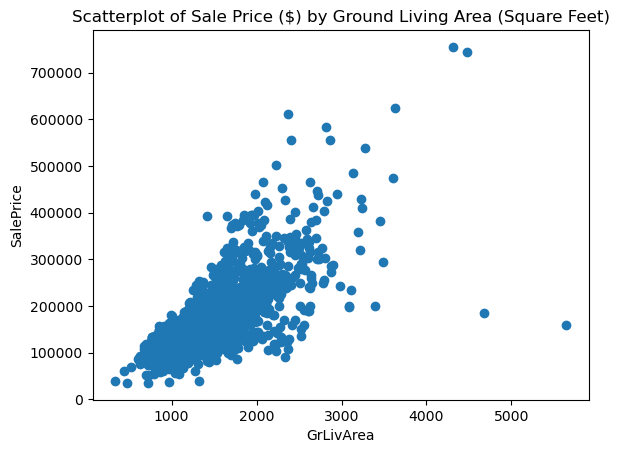

In [39]:
# Plotting SalePrice by GrLivArea #

# Scatter Plot
plt.scatter(x= houses_train["GrLivArea"], y=houses_sale)

# labels
plt.title('Scatterplot of Sale Price ($) by Ground Living Area (Square Feet)')
plt.xlabel('GrLivArea')
plt.ylabel('SalePrice')

# Showing the Scatter
plt.show()

### Outliers Found:
- Two houses with high GrLivArea sold for less than expected
- Removing these two

In [64]:
houses_encoded_engi = houses_encoded_engi[houses_encoded_engi['GrLivArea'] < 4480]
# Removing the Outliers by GrLivArea Cutoff

Text(0, 0.5, 'SalePrice')

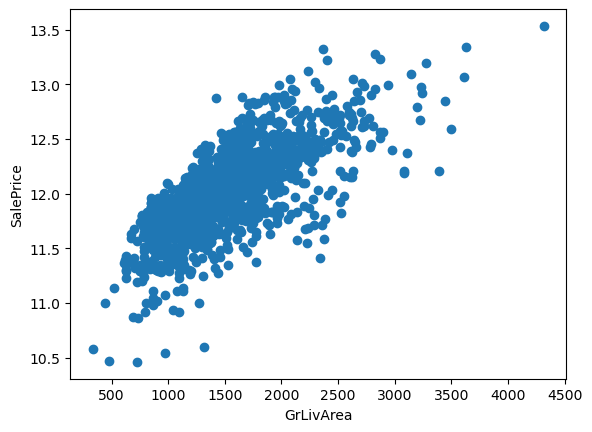

In [65]:
# Checking to make sure the Cutoff Worked

plt.scatter(x= houses_encoded_engi["GrLivArea"], y=houses_encoded_engi['SalePrice'])
plt.xlabel('GrLivArea')
plt.ylabel('SalePrice')

---
## Dropping Sale Price Now After EDA

In [66]:
houses_encoded = houses_encoded.drop(columns='SalePrice', axis=1)

In [67]:
houses_encoded_engi.drop(columns='SalePrice', axis=1, inplace=True)

---
## 2. Checking Linearity Assumption


- Checking Linear Relationship bwtn x/y variables

- Using Scatterplots to see if any linear relationship between the dependent var (sale price) and the independent vars (every other column)

- Many vars have some kind of linear relation with sales price (most positive, e.g. more SF higher Sale Price)

- Multicollinearity seems very possible with different columns that are very similar such as different SF measurements for the same area, or one area having high SF most likely means other areas with have higher SF as well

### 1.1 Scatterplot of Variables

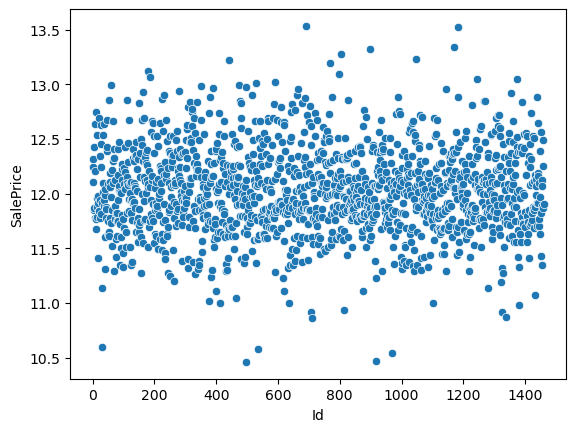

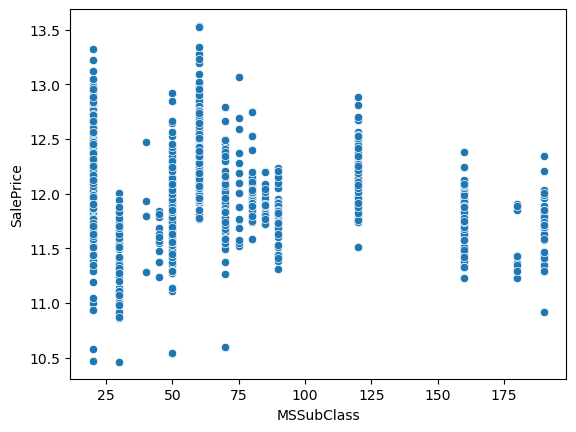

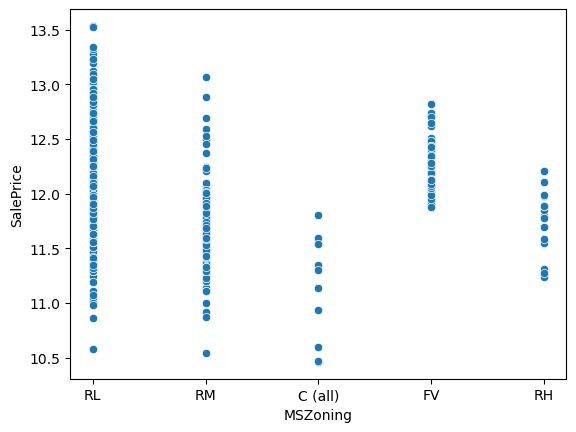

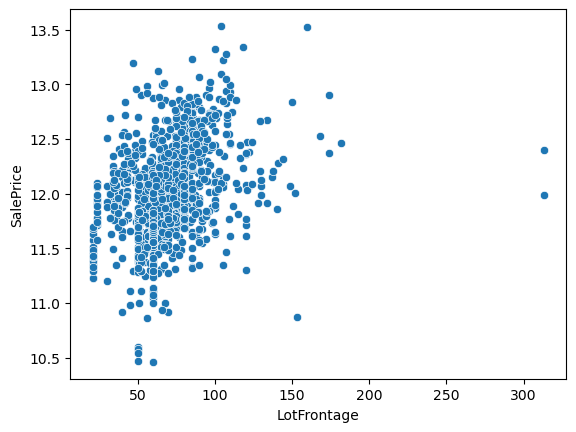

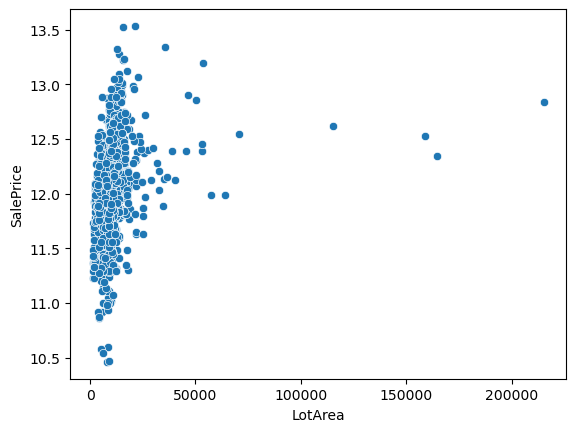

...

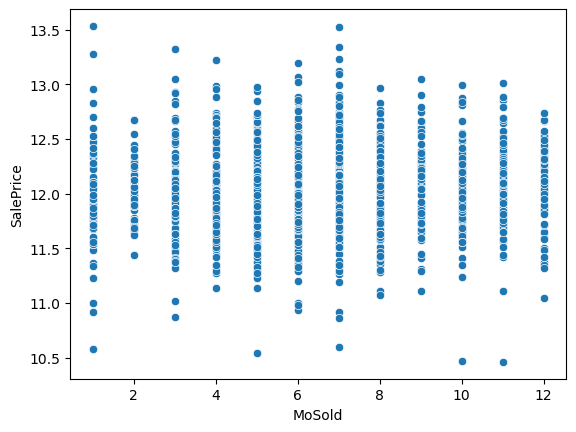

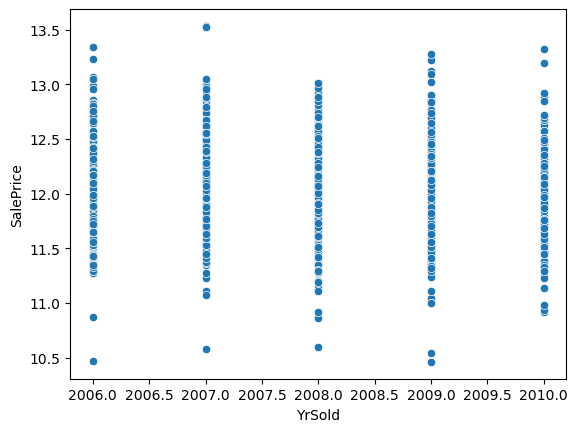

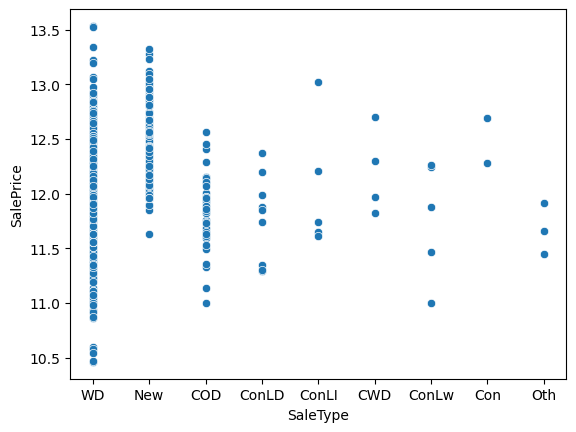

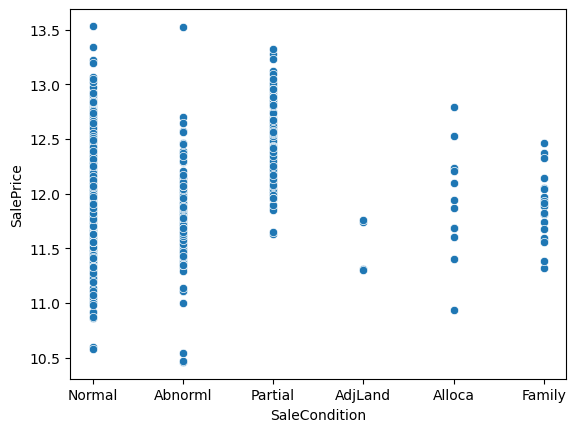

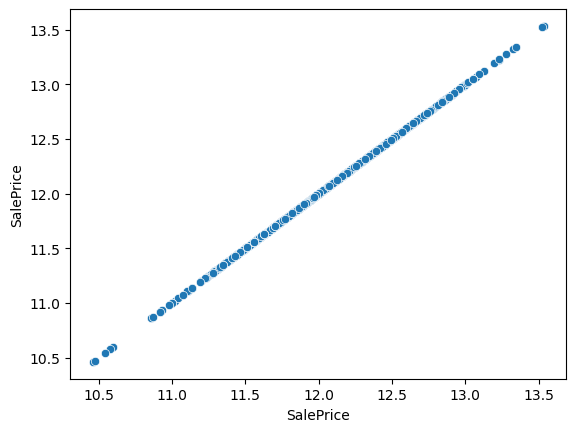

In [68]:
# For Loop for Multiple Scatter Plots for Each Column in Training Data

ind_vars = houses_train.columns  # Independent Variables

#dp_var = houses_target          # Dependent Variable

for var in ind_vars:
    sns.scatterplot(data = houses_train, x=var, y= houses_target)
    plt.show()

---
## 2. Independent Errors Assumption
- Need to ensure no relationship betweens the errors 
- Using a Scatterplot of 'Residuals versus Fits' (corr should be ~0)

In [69]:
# Predicted Values of Model

y_predicted = model_lasso.predict(houses_encoded)

NameError: name 'model_lasso' is not defined

In [796]:
# Residual Errors

residuals = houses_target - y_predicted

### 2.1 Residuals vs Fitted

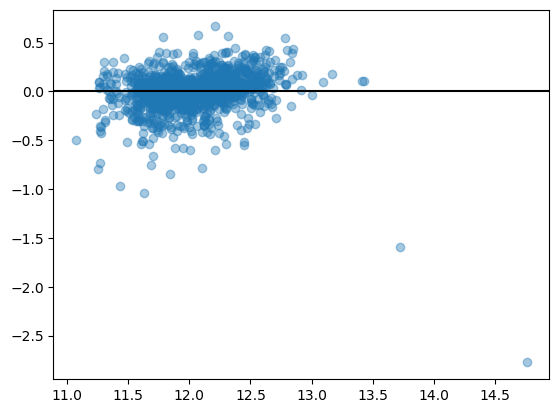

In [797]:
# Residuals vs Fits Scatterplot

plt.scatter(y_predicted, residuals, alpha= 0.4)
plt.axhline(y=0, color='black', linewidth=1.5)
plt.show()

# Two potential outliers in scatter -> do I need to remove? how would I identify and remove them??

# Rest of plot looks good, errors look like they have no relationship

## Looking at Residuals Again
- Adjusted DF removing outliers
- Looks move better

In [799]:
y_predicted_engi = model_lasso_engi.predict(houses_encoded_engi)

residuals_engi = houses_encoded_engi_target - y_predicted_engi

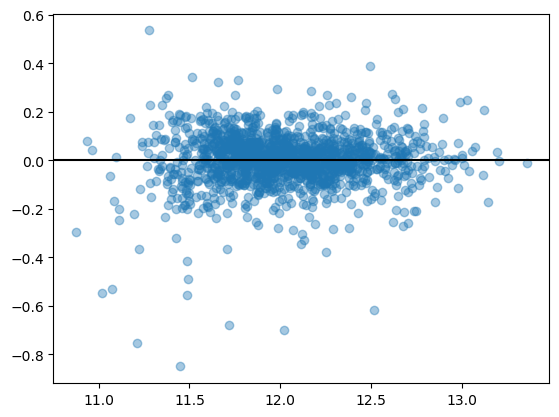

In [800]:
plt.scatter(y_predicted_engi, residuals_engi, alpha= 0.4)
plt.axhline(y=0, color='black', linewidth=1.5)
plt.show()

---
## 3. Constant Variance of Errors Assumption

- Same plot as Independent Errors
- Looking for constant variance btwn residuals using same plot as Independent Errors Assumption

### 3.1 Residuals vs Fitted

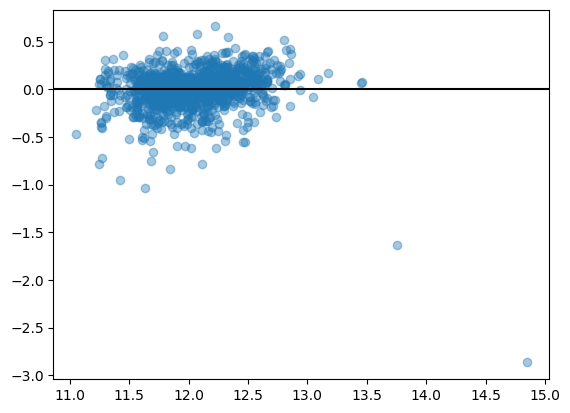

In [288]:
# Residuals vs Fits Scatterplot

plt.scatter(y_predicted, residuals, alpha= 0.4)
plt.axhline(y=0, color='black', linewidth=1.5)
plt.show()

# Two potential outliers in scatter -> do I need to remove? how would I identify and remove them??

# Rest of plot looks good, errors look like they have constant variance

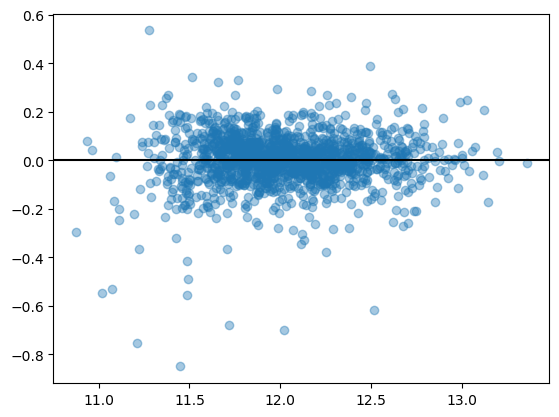

In [801]:
plt.scatter(y_predicted_engi, residuals_engi, alpha= 0.4)
plt.axhline(y=0, color='black', linewidth=1.5)
plt.show()

---
## 4. Normally Distributed Errors Assumption

- Need to check to ensure errors/residuals are normall distributed
- Will use a normal histogram/density plot and a QQ plot to check

### 4.1 Residuals Density Plot

- Looks relatively normal

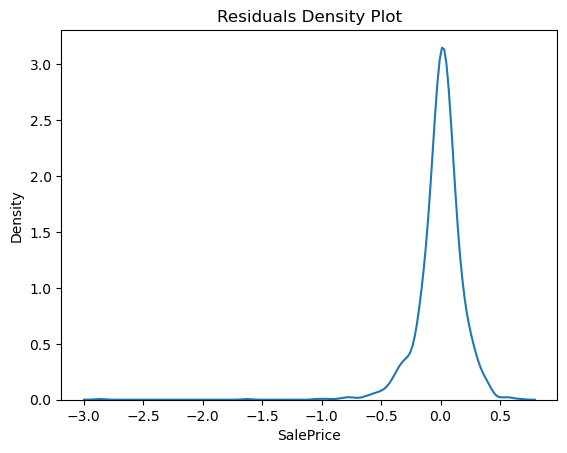

In [289]:
sns.kdeplot(residuals)
plt.title('Residuals Density Plot')
plt.show()

### 4.2 Residuals Histogram

- Looks relatively normal

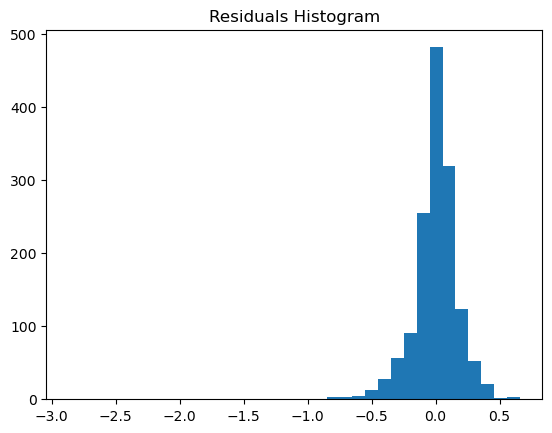

In [290]:
plt.hist(residuals, bins=35)
plt.title('Residuals Histogram')
plt.show()

### 4.3 QQ Plot

- Looks ok, maybe two outliers there still

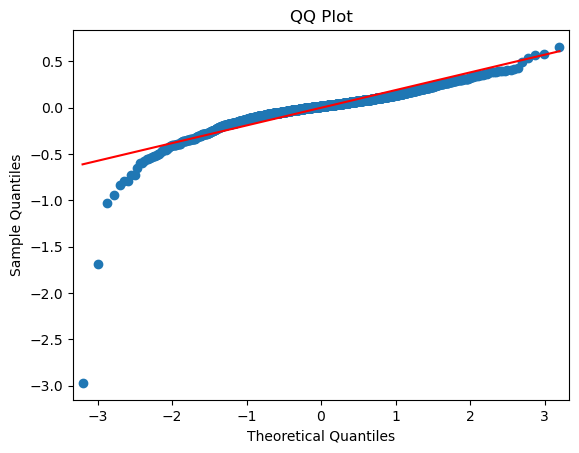

In [50]:
qqplot(residuals, line='s')
plt.title("QQ Plot")
plt.show()

## Fixing QQ Plot
- Using feature engi dataset
- Doesn't look good but scale is very zoomed in
- Better than above QQ plot now

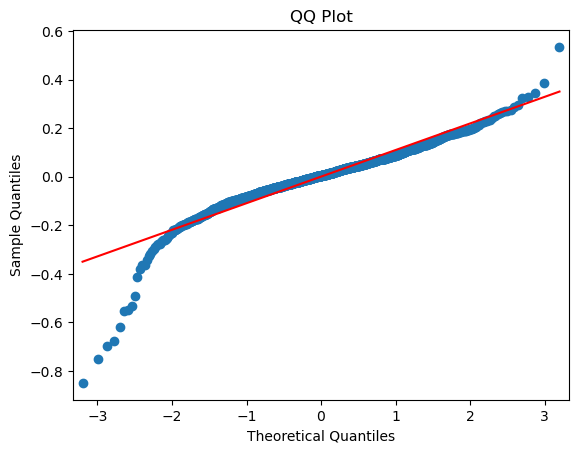

In [802]:
qqplot(residuals_engi, line='s')
plt.title("QQ Plot")
plt.show()

---
## 5. Multicollinearity

- Definitely going to be an issue in this dataset with similar independent/X variables
- Lasso Penalization should penalize all coefficients that are correlated with each other
- Can check VIF and correlation matrix

### 5.1 Correlation Matrix Heatmap

- Looking at correlation between variables (not just between target)
- Correlation should be low
- Lasso should penalize all high corr variables (selects one and the rest go towards 0 coef, controlled by alpha param)

In [70]:
houses_encoded.shape

(1460, 245)

In [71]:
# Subsetting by 15 columns for encoded DF

houses_set_1 = houses_encoded.iloc[:, :15]
houses_set_2 = houses_encoded.iloc[:, 15:30]
houses_set_3 = houses_encoded.iloc[:, 30:45]
houses_set_4 = houses_encoded.iloc[:, 60:75]
houses_set_5 = houses_encoded.iloc[:, 75:90]
houses_set_6 = houses_encoded.iloc[:, 90:105]
houses_set_7 = houses_encoded.iloc[:, 105:120]
houses_set_8 = houses_encoded.iloc[:, 120:135]
houses_set_9 = houses_encoded.iloc[:, 135:150]
houses_set_10 = houses_encoded.iloc[:, 150:165]
houses_set_11 = houses_encoded.iloc[:, 165:180]
houses_set_12 = houses_encoded.iloc[:, 180:195]
houses_set_13 = houses_encoded.iloc[:, 195:210]
houses_set_14 = houses_encoded.iloc[:, 210:225]
houses_set_15 = houses_encoded.iloc[:, 225:240]
houses_set_16 = houses_encoded.iloc[:, 240:255]

In [72]:
# Corr Matrices

corr_mtrx_1 = houses_set_1.corr()
corr_mtrx_2 = houses_set_2.corr()
corr_mtrx_3 = houses_set_3.corr()
corr_mtrx_4 = houses_set_4.corr()
corr_mtrx_5 = houses_set_5.corr()
corr_mtrx_6 = houses_set_6.corr()
corr_mtrx_7 = houses_set_7.corr()
corr_mtrx_8 = houses_set_8.corr()
corr_mtrx_9 = houses_set_9.corr()
corr_mtrx_10 = houses_set_10.corr()
corr_mtrx_11 = houses_set_11.corr()
corr_mtrx_12 = houses_set_12.corr()
corr_mtrx_13 = houses_set_13.corr()
corr_mtrx_14 = houses_set_14.corr()
corr_mtrx_15 = houses_set_15.corr()
corr_mtrx_16 = houses_set_16.corr()

In [73]:
cmap = 'coolwarm'

### Matrix 1

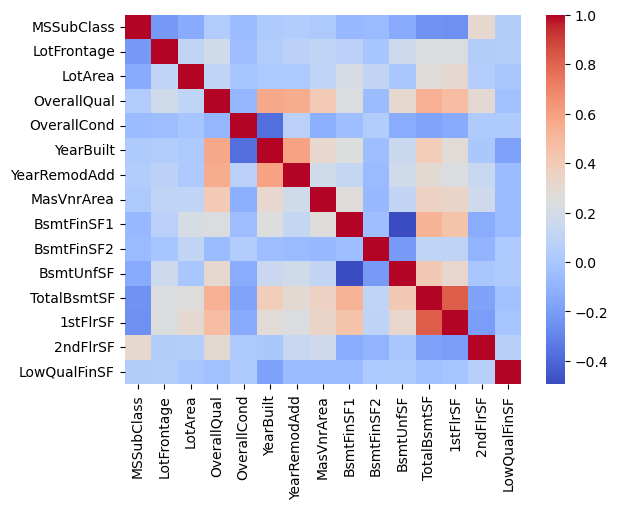

<Figure size 2000x1600 with 0 Axes>

In [74]:
sns.heatmap(corr_mtrx_1, cmap=cmap)
plt.figure(figsize=(20,16))
plt.show()

### Matrix 2

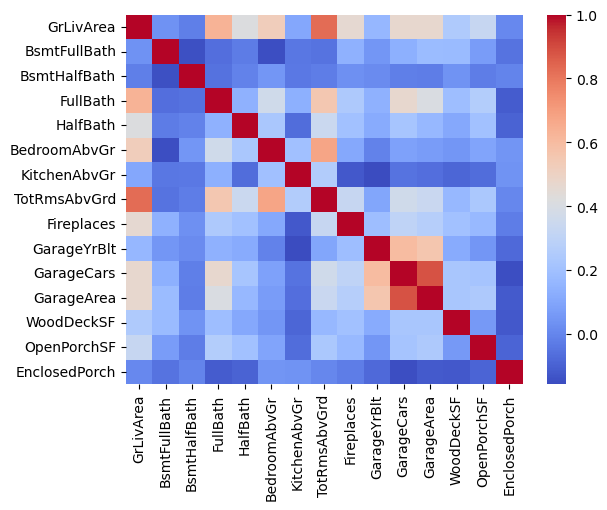

<Figure size 2000x1600 with 0 Axes>

In [75]:
# Remove two

sns.heatmap(corr_mtrx_2, cmap=cmap)
plt.figure(figsize=(20,16))
plt.show()



## Keep the more descriptive feature -> remove numberofcars feature

### Matrix 3

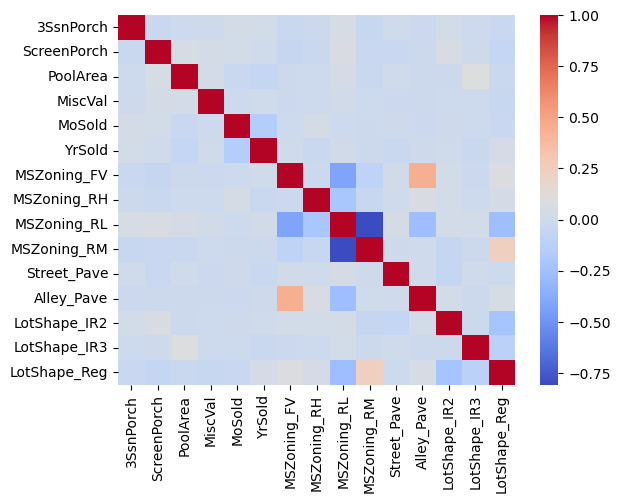

<Figure size 2000x1600 with 0 Axes>

In [76]:
# Remove two

sns.heatmap(corr_mtrx_3, cmap=cmap)
plt.figure(figsize=(20,16))
plt.show()

### Matrix 4

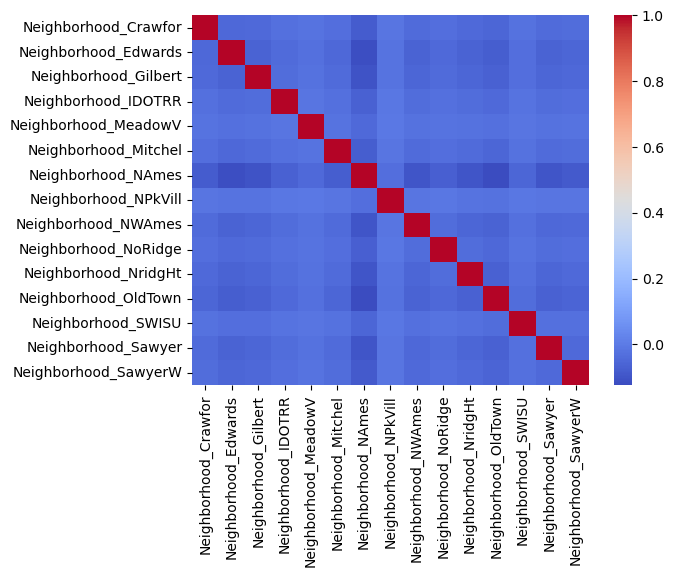

<Figure size 2000x1600 with 0 Axes>

In [77]:
# Remove one

sns.heatmap(corr_mtrx_4, cmap=cmap)
plt.figure(figsize=(20,16))
plt.show()

### Matrix 5

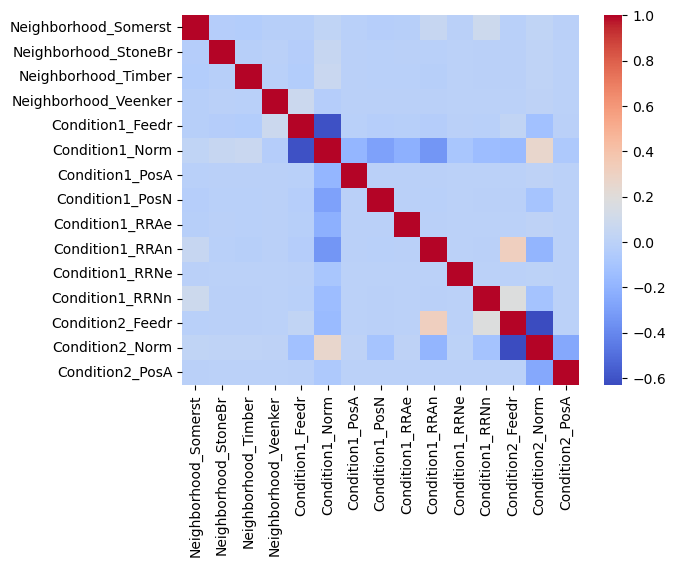

<Figure size 2000x1600 with 0 Axes>

In [78]:
sns.heatmap(corr_mtrx_5, cmap=cmap)
plt.figure(figsize=(20,16))
plt.show()

# OK

### Matrix 6

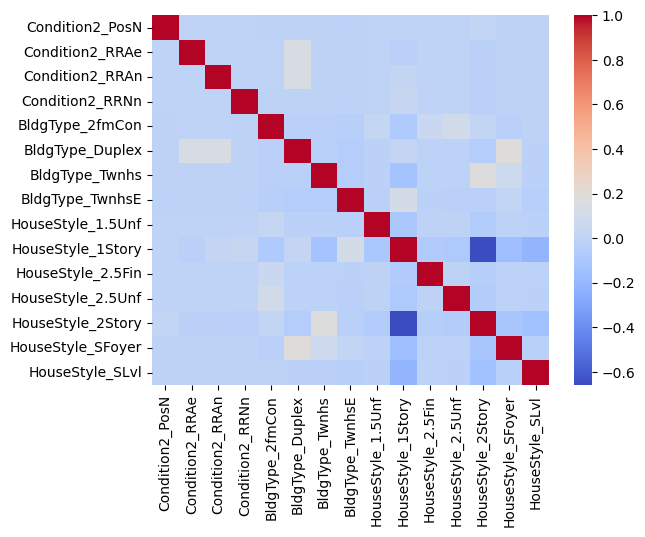

<Figure size 2000x1600 with 0 Axes>

In [79]:
# Possibly remove

sns.heatmap(corr_mtrx_6, cmap=cmap)
plt.figure(figsize=(20,16))
plt.show()

### Matrix 7

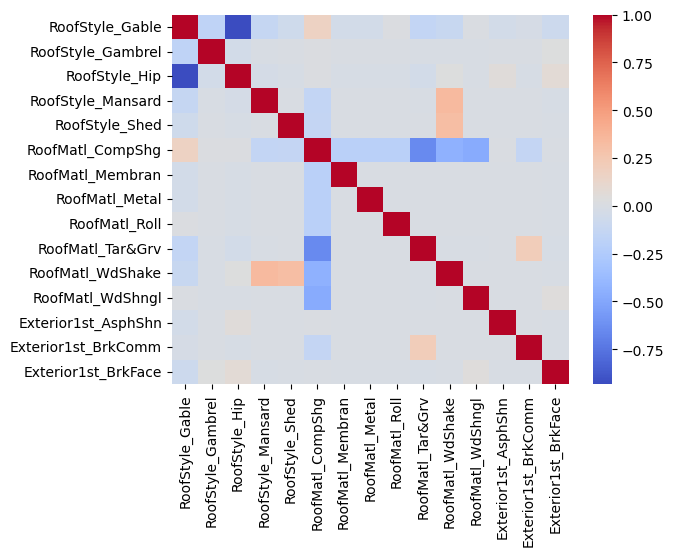

<Figure size 2000x1600 with 0 Axes>

In [80]:
# Possibly remove

sns.heatmap(corr_mtrx_7, cmap=cmap)
plt.figure(figsize=(20,16))
plt.show()

### Matrix 8

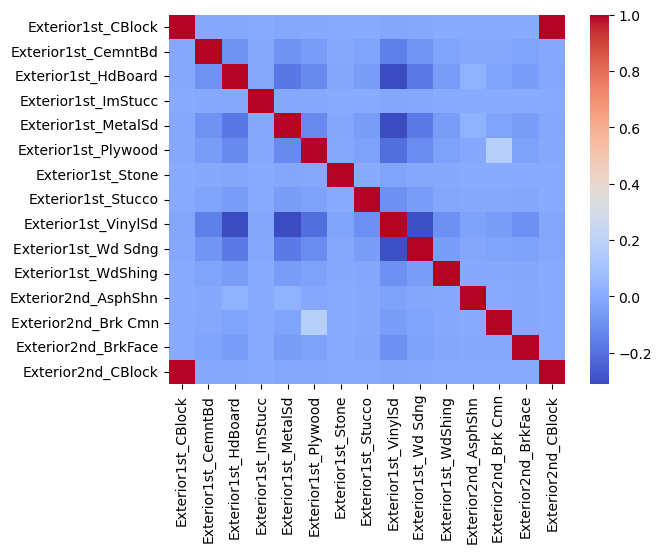

<Figure size 2000x1600 with 0 Axes>

In [81]:
# Possibly Remove

sns.heatmap(corr_mtrx_8, cmap=cmap)
plt.figure(figsize=(20,16))
plt.show()

### Matrix 9

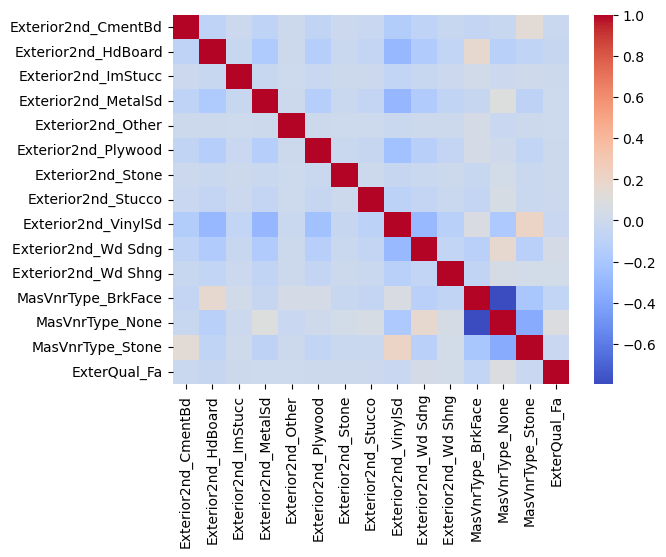

<Figure size 2000x1600 with 0 Axes>

In [82]:
sns.heatmap(corr_mtrx_9, cmap=cmap)
plt.figure(figsize=(20,16))
plt.show()

# OK

### Matrix 10

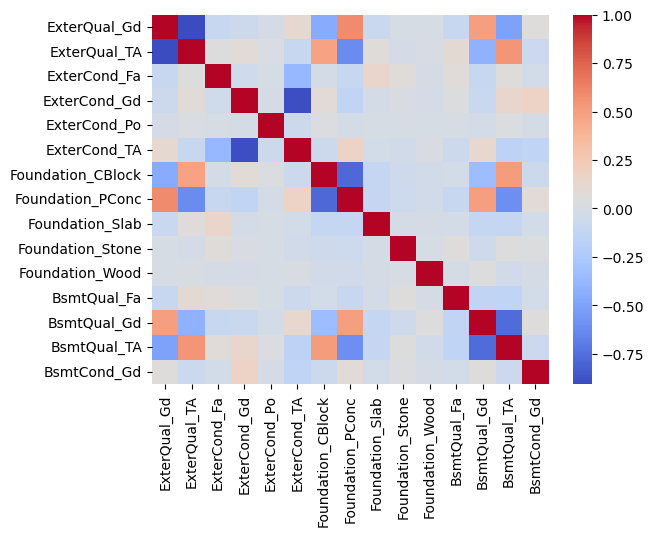

<Figure size 2000x1600 with 0 Axes>

In [83]:
sns.heatmap(corr_mtrx_10, cmap=cmap)
plt.figure(figsize=(20,16))
plt.show()

# OK

### Matrix 11

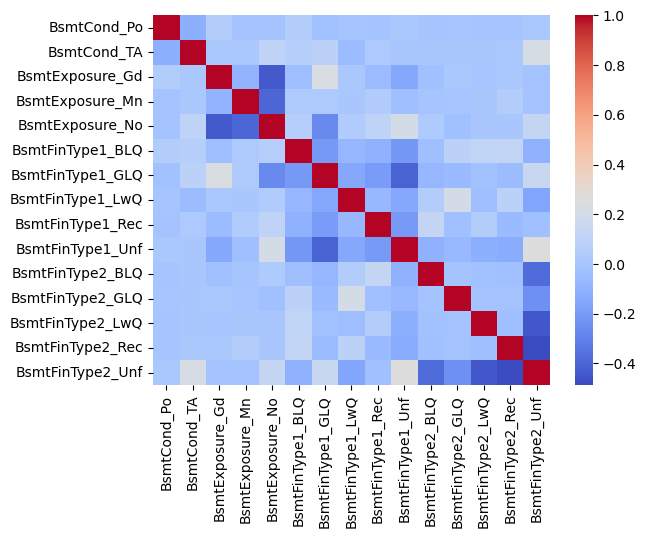

<Figure size 2000x1600 with 0 Axes>

In [84]:
## Drop two in here

sns.heatmap(corr_mtrx_11, cmap=cmap)
plt.figure(figsize=(20,16))
plt.show()

### Matrix 12

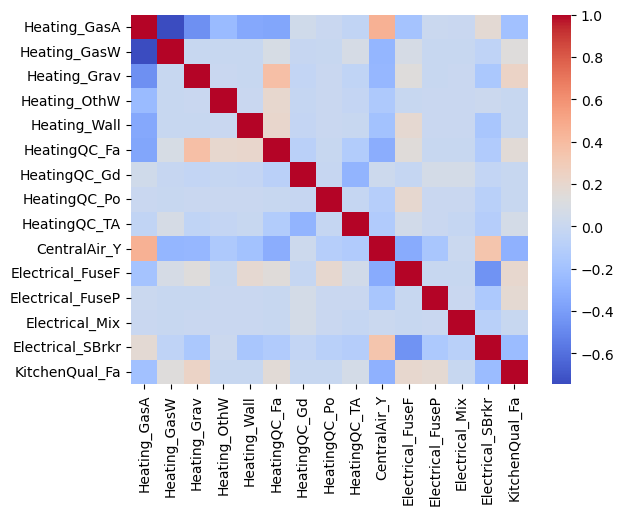

<Figure size 2000x1600 with 0 Axes>

In [85]:
## Might drop one

sns.heatmap(corr_mtrx_12, cmap=cmap)
plt.figure(figsize=(20,16))
plt.show()

### Matrix 13

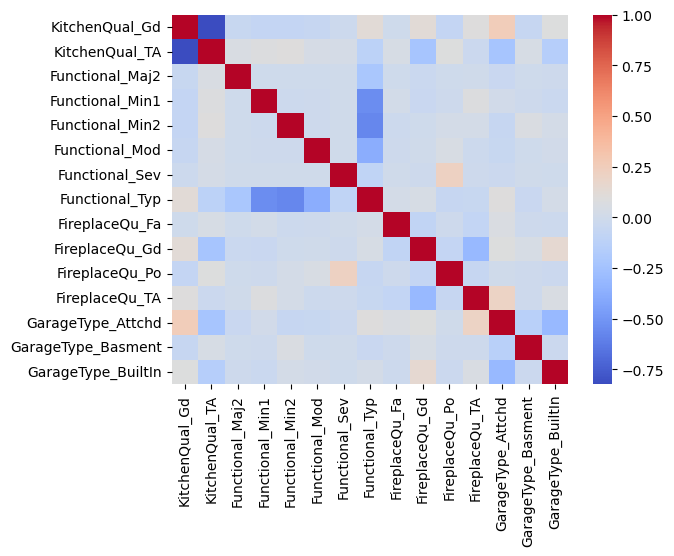

<Figure size 2000x1600 with 0 Axes>

In [86]:
sns.heatmap(corr_mtrx_13, cmap=cmap)
plt.figure(figsize=(20,16))
plt.show()

# OK

### Matrix 14

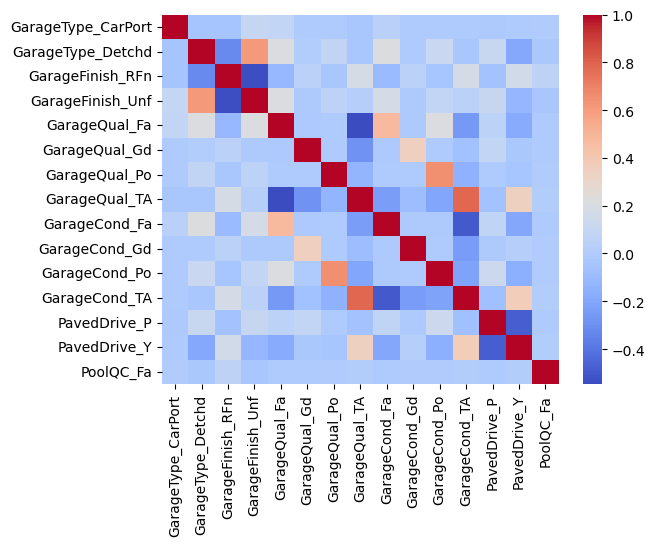

<Figure size 2000x1600 with 0 Axes>

In [87]:
## Might drop one of these

sns.heatmap(corr_mtrx_14, cmap=cmap)
plt.figure(figsize=(20,16))
plt.show()

### Matrix 15

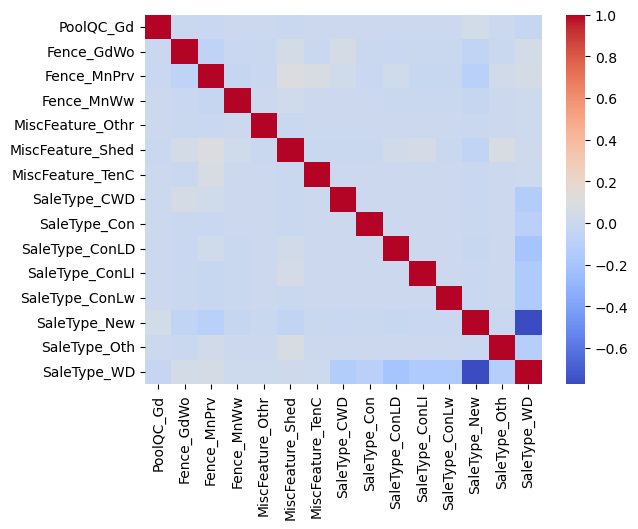

<Figure size 2000x1600 with 0 Axes>

In [88]:
## Might drop one of these

sns.heatmap(corr_mtrx_15, cmap=cmap)
plt.figure(figsize=(20,16))
plt.show()

### Matrix 16

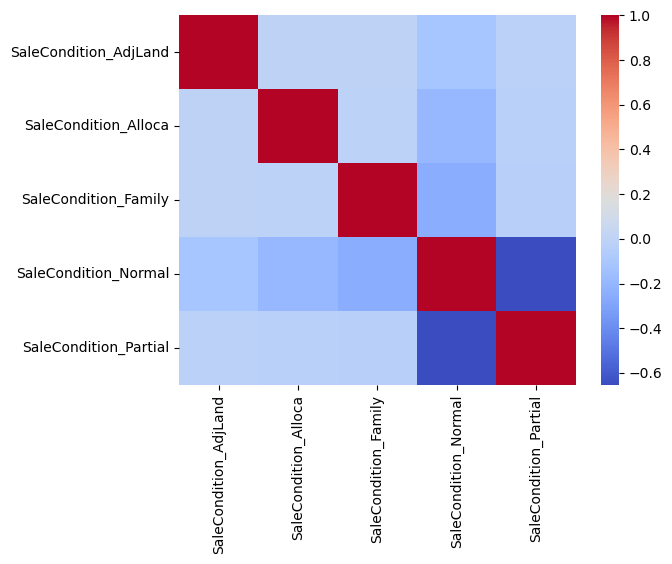

<Figure size 2000x1600 with 0 Axes>

In [89]:
sns.heatmap(corr_mtrx_16, cmap=cmap)
plt.figure(figsize=(20,16))
plt.show()

# OK

---
# Lasso MLR Models

1. Lasso model explanation
2. Param tuning (alpha specifically)
3. Cross Validation (testing dif alphas and other params to find best model)
4. Model Equation
5. Model Evaluation and MSE
6. Important Columns
7. Model Display
8. Feature Engineering Additions

In [90]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

In [91]:
from sklearn.model_selection import train_test_split

## Original Lasso Model

In [784]:
houses_encoded.drop(columns='Id', axis=1, inplace=True)

In [785]:
X = houses_encoded
y = houses_target

In [786]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 70/30 look up

In [787]:
from sklearn.linear_model import Lasso

In [788]:
model_lasso = Lasso(alpha = 1)

In [789]:
model_lasso.fit(X_train, y_train)

Lasso(alpha=1)

In [790]:
model_lasso.coef_

array([-0.00000000e+00, -0.00000000e+00,  1.60261973e-06,  0.00000000e+00,
        0.00000000e+00,  2.45178782e-03,  1.38030751e-03,  3.81076738e-05,
        3.44477237e-05,  0.00000000e+00, -0.00000000e+00,  1.42461118e-04,
        0.00000000e+00,  9.46648905e-06, -0.00000000e+00,  3.11726413e-04,
        0.00000000e+00, -0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
       -0.00000000e+00, -0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        7.10667524e-05,  0.00000000e+00,  2.97193191e-04,  1.50569911e-04,
        0.00000000e+00, -0.00000000e+00,  0.00000000e+00,  9.34202076e-05,
       -4.04403377e-07, -0.00000000e+00,  0.00000000e+00, -0.00000000e+00,
        0.00000000e+00, -0.00000000e+00,  0.00000000e+00, -0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00, -0.00000000e+00,
       -0.00000000e+00,  0.00000000e+00, -0.00000000e+00,  0.00000000e+00,
       -0.00000000e+00,  0.00000000e+00, -0.00000000e+00,  0.00000000e+00,
       -0.00000000e+00,  

In [791]:
model_lasso.intercept_

3.500992915981053

In [792]:
houses_encoded.columns[np.abs(model_lasso.coef_) > 0]

Index(['LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
       'TotalBsmtSF', '2ndFlrSF', 'GrLivArea', 'GarageYrBlt', 'GarageArea',
       'WoodDeckSF', 'ScreenPorch', 'PoolArea'],
      dtype='object')

In [793]:
len(houses_encoded.columns[np.abs(model_lasso.coef_) > 0])

13

## Original Lasso Model Scoring

In [41]:
lasso_preds = model_lasso.predict(X_test)

In [918]:
mean_squared_error(y_test, lasso_preds)

0.03637563520995113

In [919]:
r2_score(y_test, lasso_preds)  ## at alpha of 1

0.8050750259065893

## Testing Different Alphas

In [234]:
alphas = [0.0001,0.0005,0.001, 0.005, 0.01,0.05, 0.1, 0.3, 1, 3, 5, 10, 15]

In [235]:
results = []

for alpha in alphas:
    model = Lasso(alpha=alpha)
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    
    mse_1 = mean_squared_error(y_test, preds)
    r_sq_1 = r2_score(y_test, preds)
    
    results.append({'alpha': alpha, 'mse': mse_1, 'R^2': r_sq_1})

In [236]:
pd.DataFrame(results)

,alpha,mse,R^2
0,0.0001,0.022056,0.881808
1,0.0005,0.020803,0.888524
2,0.0010,0.020227,0.891611
3,0.0050,0.022293,0.880540
4,0.0100,0.023818,0.872365
5,0.0500,0.029042,0.844373
6,0.1000,0.032426,0.826241
7,0.3000,0.032786,0.824311
8,1.0000,0.036376,0.805075
9,3.0000,0.048706,0.739000


---
## Lasso Tuned Model Testing and Scoring

- Better score but more coefficients and more columns needed to predict
- If you do not have all the columns might not be able to predict accuractly
- More columns because alpha is smaller and less penalization happened
- Alpha of 1 has only 13 coefficients compared to 86 for the best model

In [892]:
model_lasso_alpha_tuned = Lasso(alpha = 0.0010)

In [920]:
model_lasso_alpha_tuned.fit(X_train, y_train)

Lasso(alpha=0.001)

In [921]:
model_lasso_alpha_tuned.coef_

array([-7.49829182e-04, -2.40667110e-04,  1.51388242e-06,  6.74093887e-02,
        3.97018156e-02,  1.79130625e-03,  1.28422371e-03, -1.35889013e-05,
        2.93688146e-06,  4.88792462e-05,  9.90355934e-06,  7.94188621e-06,
        1.75662858e-04,  1.89657233e-04,  2.00785557e-04,  2.49088154e-05,
        5.58576716e-02,  0.00000000e+00,  1.48518343e-02,  1.53068412e-02,
        9.49312537e-03, -0.00000000e+00,  1.11852957e-02,  3.63777665e-02,
        2.66940477e-05,  5.64615589e-02,  3.01457577e-05,  1.38709619e-04,
        2.31956652e-06,  1.44401087e-04,  2.69308942e-04,  3.15315942e-04,
       -2.73083088e-04, -6.07502644e-06, -0.00000000e+00, -4.59835758e-03,
        0.00000000e+00, -0.00000000e+00,  0.00000000e+00, -5.16073528e-02,
        0.00000000e+00,  0.00000000e+00,  2.07117626e-03, -2.60257154e-02,
        0.00000000e+00,  1.58986803e-02,  0.00000000e+00,  1.00171572e-02,
       -0.00000000e+00,  4.09772587e-02, -0.00000000e+00, -0.00000000e+00,
       -0.00000000e+00,  

In [922]:
model_lasso_alpha_tuned.intercept_

13.70400513616475

In [923]:
houses_encoded.columns[np.abs(model_lasso_alpha_tuned.coef_) > 0]

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
       'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea',
       'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'PoolArea', 'MiscVal', 'YrSold', 'MSZoning_RM',
       'LotShape_IR2', 'LotShape_IR3', 'LandContour_HLS', 'LandContour_Lvl',
       'LotConfig_CulDSac', 'Neighborhood_BrkSide', 'Neighborhood_Crawfor',
       'Neighborhood_Edwards', 'Neighborhood_Gilbert', 'Neighborhood_NoRidge',
       'Neighborhood_NridgHt', 'Neighborhood_Somerst', 'Neighborhood_StoneBr',
       'Condition1_Norm', 'BldgType_2fmCon', 'BldgType_Twnhs',
       'HouseStyle_2Story', 'RoofStyle_Gable', 'Exterior1st_BrkFace',
       'Exterior1st_HdBoard', 'Ext

In [924]:
len(houses_encoded.columns[np.abs(model_lasso_alpha_tuned.coef_) > 0])

81

In [925]:
lasso_preds_tuned = model_lasso_alpha_tuned.predict(X_test)

In [928]:
mean_squared_error(y_test, lasso_preds_tuned)

0.020226929614124336

In [929]:
r2_score(y_test, lasso_preds_tuned)

0.8916105874642203

---
## Feature Engi Lasso Tuned Model Testing and Scoring
- Try standard scalering this is still not converging 
- Increase max iters but not too high
- Change alpha with for loop

In [895]:
# Xclean/yclean vars #

In [99]:
house_ids = houses_encoded_engi['Id']

KeyError: 'Id'

In [100]:
houses_encoded_engi.drop(columns='Id', axis=1, inplace=True)

KeyError: "['Id'] not found in axis"

In [101]:
Xclean = houses_encoded_engi
yclean = houses_encoded_engi_target

In [102]:
Xclean_train, Xclean_test, yclean_train, yclean_test = train_test_split(Xclean, yclean, test_size=0.2, random_state=42)

ValueError: Found input variables with inconsistent numbers of samples: [1457, 1460]

In [907]:
model_lasso_engi = Lasso(alpha=0.0001, max_iter=1000)

In [908]:
model_lasso_engi.fit(Xclean_train, yclean_train)

Lasso(alpha=0.0001)

In [909]:
lasso_preds_engi = model_lasso_engi.predict(Xclean_test)

In [910]:
mean_squared_error(yclean_test, lasso_preds_engi)

0.01603171558581397

In [911]:
np.sqrt(mean_squared_error(yclean_test, lasso_preds_engi))

0.12661641120255293

In [912]:
houses_encoded_engi.columns[np.abs(model_lasso_engi.coef_) > 0]

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       ...
       'Fence_MnPrv', 'Fence_MnWw', 'SaleType_CWD', 'SaleType_ConLD',
       'SaleType_New', 'SaleType_WD', 'SaleCondition_AdjLand',
       'SaleCondition_Alloca', 'SaleCondition_Family', 'SaleCondition_Normal'],
      dtype='object', length=172)

In [930]:
r2_score(yclean_test, lasso_preds_engi)

0.8984953172244837

---
## Lasso Tuned and Normalized

In [165]:
model_lasso_alpha_tuned_norm = Lasso(alpha = .0001, normalize=True)

In [166]:
model_lasso_alpha_tuned_norm.fit(X_train, y_train)

C:\Users\teste\anaconda3\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(


Lasso(alpha=0.0001, normalize=True)

In [167]:
lasso_preds_norm = model_lasso_alpha_tuned_norm.predict(X_test)

In [168]:
mean_squared_error(y_test, lasso_preds_norm)

0.024673503950483556

- Normalizing does not lower MSE

---
## Ridge Regression
- Does not penalize the same way as Lasso
- Coefs will never be 0, just get smaller using squared values

In [169]:
from sklearn.linear_model import Ridge

In [170]:
model_ridge = Ridge(alpha=10)

In [171]:
model_ridge.fit(X_train, y_train)

Ridge(alpha=10)

In [172]:
model_ridge.coef_

array([-6.49037328e-04, -2.56135406e-04,  1.28460977e-06,  5.80452198e-02,
        3.66316447e-02,  1.37846287e-03,  1.15324088e-03, -8.97864858e-07,
       -1.94069607e-05,  4.70915096e-05, -7.63458381e-06,  2.00499728e-05,
        3.54722431e-05,  4.51297641e-05,  8.33038160e-05,  1.63905822e-04,
        5.39998882e-02,  1.10780616e-02,  2.75844142e-02,  2.91870278e-02,
        1.57199346e-02, -2.65878981e-02,  1.10637347e-02,  2.82227155e-02,
        3.25177592e-05,  5.56990432e-02,  1.66849350e-05,  1.29970507e-04,
       -9.81325611e-06,  1.36370032e-04,  2.65145285e-04,  2.70741116e-04,
       -1.94029814e-04, -3.44347195e-06,  1.65013847e-04, -4.38219206e-03,
        3.35596432e-02,  2.10970508e-02,  3.23397032e-02, -1.60220250e-02,
        1.48149520e-03,  2.37147581e-02,  3.00847803e-02, -5.93185400e-02,
        4.54378027e-03,  6.47902209e-02,  2.76644710e-02,  4.71103525e-02,
       -1.94731801e-02,  4.06702844e-02, -2.48265488e-02, -1.21201809e-02,
       -7.07018178e-03,  

In [173]:
model_ridge.intercept_

14.282993539574253

In [174]:
y_pred_ridge = model_ridge.predict(X_test)

In [175]:
mean_squared_error(y_test, y_pred_ridge)

0.01916163980723221

In [245]:
ridge_alphas = [0.05, 0.1, 0.3, 1, 3, 5, 10, 15]

In [246]:
results_ridge = []

for alpha in ridge_alphas:
    model_r = Ridge(alpha=alpha)
    model_r.fit(X_train, y_train)
    preds_r = model_r.predict(X_test)
    
    mse_r = mean_squared_error(y_test, preds_r)
    r_sq_r = r2_score(y_test, preds_r)
    
    results_ridge.append({'alpha': alpha, 'mse': mse_r, 'R^2': r_sq_r})

In [247]:
pd.DataFrame(results_ridge)

,alpha,mse,R^2
0,0.05,0.023056,0.876450
1,0.10,0.020925,0.887870
2,0.30,0.019726,0.894294
3,1.00,0.019262,0.896782
4,3.00,0.019158,0.897340
5,5.00,0.019151,0.897377
6,10.00,0.019162,0.897319
7,15.00,0.019190,0.897167


---
## Ridge Tuned Model
- Alpha of 5 has smallest MSE and highest R^2

In [179]:
model_ridge_tuned = Ridge(alpha=5)

In [180]:
model_ridge_tuned.fit(X_train, y_train)

Ridge(alpha=5)

In [76]:
model_ridge_tuned.coef_

array([-6.13540683e-04, -2.38037591e-04,  1.24796995e-06,  5.43752008e-02,
        3.55041254e-02,  1.32434929e-03,  1.10916952e-03, -2.10811505e-08,
       -2.03909489e-05,  4.85584428e-05, -7.57645302e-06,  2.05910482e-05,
        3.04017703e-05,  3.90837759e-05,  1.01677930e-04,  1.71163489e-04,
        5.27898600e-02,  1.02506875e-02,  2.91128811e-02,  3.05793284e-02,
        1.65355556e-02, -3.53384337e-02,  1.02200594e-02,  2.63715550e-02,
        3.57462374e-05,  5.51706256e-02,  1.38592661e-05,  1.28935224e-04,
       -3.86417498e-06,  1.29280663e-04,  2.64091574e-04,  2.56403820e-04,
       -1.52808171e-04, -2.48561973e-06,  1.22521437e-04, -4.14182563e-03,
        4.77841479e-02,  3.79943683e-02,  4.43627541e-02,  3.61975469e-03,
        2.75769127e-03,  2.87261826e-02,  3.41857434e-02, -7.47808221e-02,
        4.97980576e-03,  7.86472430e-02,  4.10202820e-02,  5.80441614e-02,
       -3.56872649e-02,  4.23446801e-02, -3.10662930e-02, -2.33527515e-02,
       -7.78316222e-03,  

In [181]:
y_pred_ridge_tuned = model_ridge_tuned.predict(X_test)

In [182]:
mean_squared_error(y_test, y_pred_ridge_tuned)

0.01915077457510339

In [183]:
len(houses_encoded.columns[np.abs(model_ridge_tuned.coef_) > 0])

#two coefs rouding error to basically 0 -> not actually 0

243

---
## Ridge Tuned and Normalized Model

In [297]:
model_ridge_tuned_norm = Ridge(alpha=.2, normalize=True)

In [298]:
model_ridge_tuned_norm.fit(X_train, y_train)

C:\Users\teste\anaconda3\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Ridge())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * n_samples. 
  warnings.warn(


Ridge(alpha=0.2, normalize=True)

In [299]:
y_pred_ridge_tuned_norm = model_ridge_tuned_norm.predict(X_test)

In [300]:
mean_squared_error(y_test, y_pred_ridge_tuned_norm)

0.023269263255067847

- Normalizing does not improve MSE

---
## Ridge Feature Engi Model

In [509]:
from sklearn.model_selection import cross_val_score

In [931]:
model_ridge_engi = Ridge(alpha=10)

In [932]:
model_ridge_engi.fit(Xclean_train, yclean_train)

Ridge(alpha=10)

In [933]:
y_pred_ridge_engi = model_ridge_engi.predict(Xclean_test)

In [934]:
mean_squared_error(yclean_test, y_pred_ridge_engi)

0.015661197709198712

In [935]:
np.sqrt(mean_squared_error(yclean_test, y_pred_ridge_engi))

0.1251447070762432

In [936]:
cv_scores_ridge = cross_val_score(model_ridge_engi, Xclean, yclean, cv=5, scoring='neg_mean_squared_error')

In [937]:
np.sqrt(-cv_scores_ridge)

array([0.11514552, 0.12533441, 0.12183487, 0.10736699, 0.11310259])

In [938]:
alphas = [0.001, 0.01, 0.1, 1, 10, 100]

best_alpha = None
best_rmse = float('inf')

for alpha in alphas:
    model_ridge_engi = Ridge(alpha=alpha)
    cv_scores_ridge = cross_val_score(model_ridge_engi, Xclean, yclean, cv=5, scoring='neg_mean_squared_error')
    rmse_scores = np.sqrt(-cv_scores_ridge)
    mean_rmse = np.mean(rmse_scores)
    
    if mean_rmse < best_rmse:
        best_alpha = alpha
        best_rmse = mean_rmse

print("Best Alpha:", best_alpha)
print("Best RMSE:", best_rmse)

Best Alpha: 10
Best RMSE: 0.1165568765569454


In [754]:
results_ridge = []

for alpha in ridge_alphas:
    model_r = Ridge(alpha=alpha)
    model_r.fit(Xclean_train, yclean_train)
    preds_r = model_r.predict(Xclean_test)
    
    mse_r = mean_squared_error(yclean_test, preds_r)
    r_sq_r = r2_score(yclean_test, preds_r)
    
    results_ridge.append({'alpha': alpha, 'mse': mse_r, 'R^2': r_sq_r})

pd.DataFrame(results_ridge)   

,alpha,mse,R^2
0,0.05,0.017587,0.888647
1,0.10,0.017401,0.889824
2,0.30,0.017005,0.892335
3,1.00,0.016448,0.895860
4,3.00,0.015973,0.898870
5,5.00,0.015825,0.899802
6,10.00,0.015729,0.900415
7,15.00,0.015730,0.900406


---
## Elastic Net Regression
- Combination of ridge and lasso
- L1 and alpha tunable params
- L1 of 0 = pure ridge
- L1 of 1 = pure lasso
- Try different alphas 
- L1 ratios to try = 0.1, 0.2, 0.5, 0.7, 0.9

In [188]:
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import ElasticNetCV

In [189]:
model_elastic_net = ElasticNet(alpha=1, l1_ratio=0.5)

In [190]:
model_elastic_net.fit(X_train, y_train)

ElasticNet(alpha=1)

In [191]:
y_pred_elastic = model_elastic_net.predict(X_test)

In [192]:
mean_squared_error(y_test, y_pred_elastic)

0.03344327347732663

## CV of Elastic Net Model

In [193]:
from sklearn.model_selection import GridSearchCV

In [946]:
EN_CV = ElasticNetCV(alphas = [.001, .01, .1, 1, 10, 15, 30],
                    l1_ratio= [0.1, 0.3, 0.5, 0.7, 0.9, 1.0], 
                    cv=5,
                    max_iter=100000)

In [939]:
Xclean_train

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,Fireplaces,GarageYrBlt,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSZoning_FV,MSZoning_RH,MSZoning_RM,Street_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_Po,GarageCond_Fa,GarageCond_Gd,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_MnWw,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
254,20,70.0,8400,5,6,1957,1957,0.0,922,0,392,1314,1314,0,0,1314,1,0,1,0,3,1,0,1957.0,294,250,0,0,0,0,0,0,6,2010,0,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,1,0,

In [940]:
yclean_train

254     11.884489
1065    12.700769
637     11.440355
1292    11.585246
514     11.477298
          ...    
1097    12.043554
1132    11.674194
1297    11.849398
862     11.931636
1128    12.278393
Name: SalePrice, Length: 1164, dtype: float64

In [947]:
EN_CV.fit(Xclean_train, yclean_train)

ElasticNetCV(alphas=[0.001, 0.01, 0.1, 1, 10, 15, 30], cv=5,
             l1_ratio=[0.1, 0.3, 0.5, 0.7, 0.9, 1.0], max_iter=100000)

In [948]:
EN_CV.alpha_

0.001

In [949]:
EN_CV.l1_ratio_

0.7

In [951]:
y_pred_elastic_engi = EN_CV.predict(Xclean_test)

In [954]:
mean_squared_error(yclean_test, y_pred_elastic_engi)

0.015927301840207506

In [955]:
np.sqrt(mean_squared_error(yclean_test, y_pred_elastic_engi))

0.12620341453466108

---
## Tuned EN Model

In [305]:
model_en_tuned = ElasticNet(alpha=0.01, l1_ratio=.1)

In [306]:
model_en_tuned.fit(X_train, y_train)

ElasticNet(alpha=0.01, l1_ratio=0.1)

In [307]:
y_pred_elastic_tuned = model_en_tuned.predict(X_test)

In [308]:
mean_squared_error(y_test, y_pred_elastic_tuned)

0.020219600277385442

In [311]:
np.sqrt(mean_squared_error(y_test, y_pred_elastic_tuned))

0.14219564085226186

## Model Equation: 
- Little Different Now Because of T/T splitting -> will change

- In case I want to show it on slides

y = 1.6e-06 * x1 + 2.4e-03 * x2 + 1.4e-03 * x3 + 4.3e-05 * x4 + 4.7e-05 * x5 + 1.6e-04 * x6 + 1.3e-05 * x7 + 3.2e-04 * x8 + 6.9e-05 * x9 + 2.8e-04 * x10 + 1.5e-04 * x11 + 1e-04 * x12 - 2.5e-07 * x13  + 3.5

---
## Random Forest Model

1. Random Forest Model Set up
2. Train Test Splitting
3. Model Tuning
4. Model Evaluation and Looking at Important Features
5. Cross Validation
6. Model Display

In [205]:
from sklearn.preprocessing import LabelEncoder

In [206]:
from sklearn.ensemble import RandomForestRegressor

In [207]:
from sklearn.model_selection import GridSearchCV

In [208]:
label_encode = LabelEncoder()

In [209]:
houses_label_encode = houses_train.copy()

In [210]:
houses_label_encode

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,12.247694
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,12.109011
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,12.317167
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,11.849398
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,12.429216
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,12.072541
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,12.254863
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,12.493130
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,Mn,GL

In [211]:
houses_label_encode = houses_label_encode.drop('Id', axis = 1)

In [212]:
houses_label_encode.fillna(0, inplace=True)

In [218]:
label_encoders = {}

for col in houses_label_encode.columns:
    if houses_label_encode[col].dtype == 'object':
        houses_label_encode[col] = houses_label_encode[col].astype(str)
        label_encoder = LabelEncoder()
        houses_label_encode[col] = label_encoder.fit_transform(houses_label_encode[col])
        label_encoders[col] = label_encoder

In [220]:
houses_label_encode

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,3,65.0,8450,1,0,3,3,0,4,0,5,2,2,0,5,7,5,2003,2003,1,1,12,13,2,196.0,2,4,2,3,4,4,3,706,6,0,150,856,1,0,1,5,856,854,0,1710,1,0,2,1,3,1,2,8,6,0,0,2,2003.0,2,2,548,5,5,2,0,61,0,0,0,0,0,0,0,0,2,2008,8,4,12.247694
1,20,3,80.0,9600,1,0,3,3,0,2,0,24,1,2,0,2,6,8,1976,1976,1,1,8,8,3,0.0,3,4,1,3,4,2,1,978,6,0,284,1262,1,0,1,5,1262,0,0,1262,0,1,2,0,3,1,3,6,6,1,5,2,1976.0,2,2,460,5,5,2,298,0,0,0,0,0,0,0,0,0,5,2007,8,4,12.109011
2,60,3,68.0,11250,1,0,0,3,0,4,0,5,2,2,0,5,7,5,2001,2002,1,1,12,13,2,162.0,2,4,2,3,4,3,3,486,6,0,434,920,1,0,1,5,920,866,0,1786,1,0,2,1,3,1,2,6,6,1,5,2,2001.0,2,2,608,5,5,2,0,42,0,0,0,0,0,0,0,0,9,2008,8,4,12.317167
3,70,3,60.0,9550,1,0,0,3,0,0,0,6,2,2,0,5,7,5,1915,1970,1,1,13,15,3,0.0,3,4,0,4,2,4,1,216,6,0,540,756,1,2,1,5,961,756,0,1717,1,0,1,0,3,1,2,7,6,1,3,6,1998.0,3,3,642,5,5,2,0,35,272,0,0,0,0,0,0,0,2,2006,8,0,11.849398
4,60,3,84.0,14260,1,0,0,3,0,2,0,15,2,2,0,5,8,5,2000,2000,1,1,12,13,2,350.0,2,4,2,3,4,1,3,655,6,0,490,1145,1,0,1,5,1145,1053,0,2198,1,0,2,1,4,1,2,9,6,1,5,2,2000.0,2,3,836,5,5,2,192,84,0,0,0,0,0,0,0,0,12,2008,8,4,12.429216
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,3,62.0,7917,1,0,3,3,0,4,0,8,2,2,0,5,6,5,1999,2000,1,1,12,13,3,0.0,3,4,2,3,4,4,6,0,6,0,953,953,1,0,1,5,953,694,0,1647,0,0,2,1,3,1,3,7,6,1,5,2,1999.0,2,2,460,5,5,2,0,40,0,0,0,0,0,0,0,0,8,2007,8,4,12.072541
1456,20,3,85.0,13175,1,0,3,3,0,4,0,14,2,2,0,2,6,6,1978,1988,1,1,9,10,4,119.0,3,4,1,3,4,4,1,790,5,163,589,1542,1,4,1,5,2073,0,0,2073,1,0,2,0,3,1,3,7,2,2,5,2,1978.0,3,2,500,5,5,2,349,0,0,0,0,0,0,3,0,0,2,2010,8,4,12.254863
1457,70,3,66.0,9042,1,0,3,3,0,4,0,6,2,2,0,5,7,9,1941,2006,1,1,5,5,3,0.0,0,2,4,4,2,4,3,275,6,0,877,1152,1,0,1,5,1188,1152,0,2340,0,0,2,0,4,1,2,9,6,2,3,2,1941.0,2,1,252,5,5,2,0,60,0,0,0,0,0,1,3,2500,5,2010,8,4,12.493130
1458,20,3,68.0,9717,1,0,3,3,0,4,0,12,2,2,0,2,5,6,1950,1996,3,1,8,8,3,0.0,3,4,1,4,4,3,3,49,5,1029,0,1078,1,2,1,1,1078,0,0,1078,1,0,1,0,2,1,2,5,6,0,0,2,1950.0,3,1,240,5,5,2,366,0,112,0,0,0,0,0,0,0,4,2010,8,4,11.864462


In [221]:
X1 = houses_label_encode.drop('SalePrice', axis = 1)
y1 = houses_label_encode['SalePrice']


X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.2)

## Label Encoded RF
- Feature importances seem odd

In [222]:
model_forest_label = RandomForestRegressor(n_estimators=100)

In [223]:
model_forest_label.fit(X1_train, y1_train)

RandomForestRegressor()

In [224]:
model_forest_label.predict(X1_test)

array([11.86002237, 12.22815726, 11.79984081, 12.35700653, 12.25095996,
       11.16040672, 12.16356626, 11.51293123, 11.96679557, 11.79565769,
       12.12969925, 11.95564111, 11.70644776, 12.40599774, 12.12030861,
       11.80654466, 12.25527856, 11.7703448 , 12.6649741 , 12.48925686,
       12.11674245, 12.30510272, 12.24798212, 12.41958306, 11.59698903,
       11.79295531, 11.87781145, 11.81288396, 11.67346112, 12.13401752,
       11.78476262, 11.53842201, 11.39320633, 12.0652544 , 11.90664399,
       12.03682635, 12.35233656, 11.88865271, 12.29847742, 12.23604531,
       12.18469313, 12.17933634, 12.20918603, 11.79101809, 11.74385514,
       12.5342017 , 11.81949523, 12.32933931, 12.26023183, 12.08719087,
       11.89721333, 12.19432123, 11.51488917, 11.79005581, 11.69530773,
       12.66628305, 11.71872319, 11.86025814, 11.68956434, 11.83469378,
       12.64134131, 11.94404728, 12.55288229, 12.51910279, 12.08987747,
       11.71059915, 11.725069  , 12.22999576, 11.96057093, 11.72

In [225]:
model_forest_label.feature_importances_

array([2.25244660e-03, 9.78959224e-03, 4.48796521e-03, 1.20980516e-02,
       9.38805214e-06, 7.19283481e-04, 1.03660591e-03, 1.56957484e-03,
       1.67050855e-06, 7.27648982e-04, 1.00916958e-03, 6.66544420e-03,
       9.64822027e-04, 2.09740565e-04, 7.82289067e-04, 1.49859126e-03,
       5.35831110e-01, 1.16144854e-02, 1.79025329e-02, 9.21028146e-03,
       6.67922818e-04, 1.44995585e-04, 2.04659922e-03, 1.93813721e-03,
       6.78663824e-04, 4.50680134e-03, 1.37518052e-03, 1.66043839e-03,
       8.97764280e-04, 2.20863305e-03, 7.33085744e-04, 1.19823252e-03,
       2.33812729e-03, 2.03933120e-02, 3.70086122e-04, 3.56050592e-04,
       4.50452891e-03, 4.87526605e-02, 3.96841348e-04, 1.42508956e-03,
       1.36052957e-02, 1.14603144e-03, 2.36021234e-02, 8.23689346e-03,
       2.05887119e-04, 1.07418457e-01, 1.06175710e-03, 3.33110091e-04,
       2.70078690e-03, 1.42572274e-03, 1.63313988e-03, 1.72977252e-03,
       2.14048532e-03, 2.99338677e-03, 7.02998731e-04, 3.56472200e-03,
      

## One Hot Encoded RF

In [214]:
model_forest_dummy = RandomForestRegressor(n_estimators=100)

In [215]:
model_forest_dummy.fit(X_train, y_train)

RandomForestRegressor()

In [216]:
model_forest_dummy.predict(X_test)

array([11.84420775, 12.66837646, 11.66765049, 11.96394317, 12.64732451,
       11.34626963, 12.26640375, 11.94057695, 11.34711889, 11.73235566,
       11.99759209, 11.67449913, 11.57592592, 12.17661824, 12.0981033 ,
       11.76397199, 12.18205276, 11.79213999, 11.65364382, 12.21844765,
       12.01690305, 12.27196589, 12.06464255, 11.71064622, 12.1744911 ,
       12.039067  , 12.12462705, 11.61272044, 12.07326691, 12.17185464,
       11.72213398, 12.4553882 , 12.01245148, 11.62951373, 12.46164004,
       11.87533876, 11.85489369, 12.22810606, 12.62517923, 11.56263319,
       11.72077121, 12.36124912, 11.70300076, 12.77998368, 11.82070388,
       11.78721596, 11.68396033, 11.76649244, 12.87424698, 11.88552978,
       11.69838242, 12.14085175, 11.66361469, 12.65935749, 11.84116275,
       12.39039155, 12.17505371, 11.91778223, 11.87465969, 11.60503356,
       11.1813427 , 11.89307739, 12.63110615, 12.46823262, 12.56237008,
       12.21260614, 11.59973588, 12.65418507, 11.65831252, 12.00

In [217]:
model_forest_dummy.feature_importances_

array([2.59900298e-03, 4.76343277e-03, 1.56437555e-02, 5.45008490e-01,
       1.05707933e-02, 1.36104196e-02, 8.65659548e-03, 2.55573680e-03,
       2.21624087e-02, 2.44205315e-04, 5.75760531e-03, 3.69544812e-02,
       2.46058138e-02, 7.52770476e-03, 1.53969698e-04, 1.11063615e-01,
       1.25008090e-03, 1.75669351e-04, 1.08834402e-03, 7.52808197e-04,
       2.22221234e-03, 1.99832067e-03, 2.14810965e-03, 7.73165793e-03,
       7.66089925e-03, 3.98054977e-02, 2.93330480e-02, 3.28304948e-03,
       5.52263645e-03, 1.64670567e-03, 9.23585638e-05, 7.38287033e-04,
       8.03876874e-05, 1.02081084e-04, 3.90451831e-03, 1.66411176e-03,
       9.14926368e-05, 7.07056554e-05, 9.73261834e-04, 3.04561818e-03,
       1.34266722e-06, 1.02455212e-04, 8.24065979e-05, 2.65819843e-05,
       1.36019236e-03, 3.17370035e-04, 7.14866791e-05, 5.15380964e-04,
       4.66935645e-06, 3.24584145e-04, 1.06595025e-04, 3.99561714e-05,
       6.55154287e-04, 1.81995402e-04, 3.47353151e-05, 1.39982735e-05,
      

---
## Feature Engi RF
- Using one hot encoded dataset with cols removed

In [566]:
model_forest_engi = RandomForestRegressor(n_estimators=100)

In [567]:
model_forest_engi.fit(Xclean_train, yclean_train)

RandomForestRegressor()

In [568]:
model_forest_engi.predict(Xclean_test)

array([[7.1324e+02, 5.3950e+01, 5.5910e+01, ..., 1.0000e-02, 9.5000e-01,
        4.0000e-02],
       [8.8743e+02, 1.1380e+02, 3.8750e+01, ..., 0.0000e+00, 1.0000e+00,
        0.0000e+00],
       [6.1437e+02, 3.9500e+01, 6.6840e+01, ..., 0.0000e+00, 7.7000e-01,
        1.6000e-01],
       ...,
       [6.5639e+02, 4.2300e+01, 6.8400e+01, ..., 0.0000e+00, 9.1000e-01,
        0.0000e+00],
       [6.1580e+02, 5.6400e+01, 5.7570e+01, ..., 0.0000e+00, 8.5000e-01,
        1.5000e-01],
       [6.4183e+02, 4.0550e+01, 6.2080e+01, ..., 0.0000e+00, 8.4000e-01,
        0.0000e+00]])

In [569]:
model_forest_engi.feature_importances_

array([1.94196038e-04, 4.79825147e-04, 3.30701658e-04, 5.32359663e-03,
       1.19556185e-04, 2.66627225e-05, 8.81980070e-05, 8.26020251e-04,
       1.33108389e-04, 6.83401728e-05, 2.34313657e-04, 5.16399422e-04,
       2.56750910e-04, 6.08776160e-05, 3.96350419e-05, 2.05818896e-06,
       8.21692132e-05, 2.41413661e-04, 1.89230246e-06, 1.12243437e-04,
       1.51868434e-05, 4.61773699e-05, 7.18917851e-07, 1.69610725e-05,
       5.11299187e-04, 1.75600360e-04, 4.13891077e-04, 1.10660361e-04,
       3.62636976e-06, 1.84121363e-06, 2.92536588e-05, 3.59243193e-07,
       8.96876964e-05, 1.17285426e-04, 4.12855056e-05, 9.81210754e-01,
       1.06525394e-06, 2.58755726e-07, 2.98787717e-06, 2.29900505e-04,
       3.49392151e-04, 7.44020472e-04, 8.81912025e-06, 7.92935769e-06,
       4.67405030e-04, 8.82863758e-06, 1.34906243e-09, 1.98132437e-05,
       6.07602769e-07, 2.93534399e-07, 1.10110475e-05, 1.20673869e-05,
       1.56446977e-03, 1.11647682e-08, 1.55656754e-06, 6.61741365e-07,
      

## Grid Search CV

- trying on both label and one hot encoded models

### Tunable Params

- n_estimators = number of trees
- max_depth = depth of each tree, controlling helps overfit, start at 10 or 20
- min_samples_split = min values required to split an internal node, larger values make model more conservative
- min_samples_leaf = min num of samples to be in leaf node, prevents overfitting
- max_features = can be integer or ratio (square root of features), controls diversity of tree

In [226]:
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2,5,10],
    'min_samples_leaf': [1,2,4]
}

In [571]:
grid_search = GridSearchCV(estimator=RandomForestRegressor(), 
                           param_grid=param_grid, 
                           cv=5, 
                           scoring='neg_mean_squared_error')



grid_search_label = GridSearchCV(estimator=RandomForestRegressor(), 
                           param_grid=param_grid, 
                           cv=5, 
                           scoring='neg_mean_squared_error')



grid_search_engi = GridSearchCV(estimator=RandomForestRegressor(), 
                           param_grid=param_grid, 
                           cv=5, 
                           scoring='neg_mean_squared_error')

In [228]:
## One Hot Encoded GS CV

grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [None, 10, 20, 30],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 200, 300]},
             scoring='neg_mean_squared_error')

In [231]:
## Label Encoded GS CV

grid_search_label.fit(X1_train, y1_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [None, 10, 20, 30],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 200, 300]},
             scoring='neg_mean_squared_error')

In [755]:
## Engi Features RF

grid_search_engi.fit(Xclean_train, yclean_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [None, 10, 20, 30],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 200, 300]},
             scoring='neg_mean_squared_error')

In [229]:
grid_search.best_params_

{'max_depth': 30,
 'min_samples_leaf': 1,
 'min_samples_split': 5,
 'n_estimators': 200}

In [230]:
grid_search.best_score_

-0.021093116405494113

In [232]:
grid_search_label.best_params_

{'max_depth': 20,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 200}

In [233]:
grid_search_label.best_score_

-0.022427058131075643

In [756]:
grid_search_engi.best_params_

{'max_depth': None,
 'min_samples_leaf': 2,
 'min_samples_split': 5,
 'n_estimators': 100}

In [757]:
grid_search_engi.best_score_

-0.01990000642969248

In [759]:
np.sqrt(-grid_search_engi.best_score_)

0.14106738258609777

---
## Optimal Parameters RF Model
- using feature engi dataset

In [968]:
model_forest_final = RandomForestRegressor(n_estimators=100, max_depth= None, min_samples_leaf=2, min_samples_split=5)

In [969]:
model_forest_final.fit(Xclean_train, yclean_train)

RandomForestRegressor(min_samples_leaf=2, min_samples_split=5)

In [970]:
y_pred_rf = model_forest_final.predict(Xclean_test)

In [971]:
r2_score(yclean_test, y_pred_rf)

0.8591006351519115

In [972]:
np.sqrt(mean_squared_error(yclean_test, y_pred_rf))

0.1491768657763665

## Model Scoring for RF's
- Scoring RF
    - MSE
    - RMSE
    - R^2

## Graphing Feature Importance

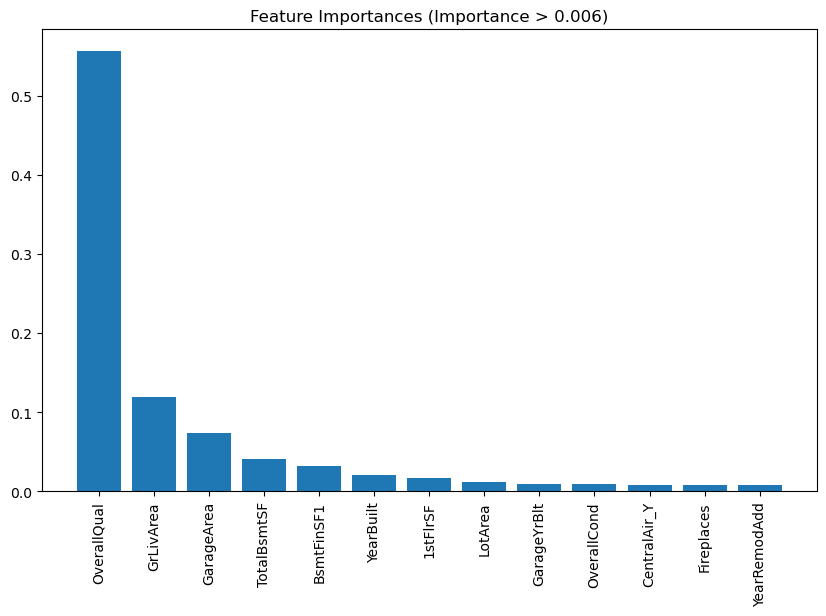

In [974]:
importances = model_forest_final.feature_importances_
feature_names = houses_encoded_engi.columns

threshold = 0.006
selected_indices = np.where(importances > threshold)
selected_importances = importances[selected_indices]
selected_feature_names = feature_names[selected_indices]
indices = np.argsort(selected_importances)[::-1]

plt.figure(figsize=(10, 6))
plt.title("Feature Importances (Importance > 0.006)")
plt.bar(range(len(selected_importances)), selected_importances[indices], align="center")
plt.xticks(range(len(selected_importances)), selected_feature_names[indices], rotation=90)
plt.show()

In [55]:
## model valuing OverallQual higher than lasso MLR because of feature interactions?

## Visualizing RF Model

In [769]:
houses_encoded_engi_target.name = 'SalePrice'

In [772]:
df = pd.DataFrame(houses_encoded_engi_target, columns=['SalePrice'])

In [770]:
houses_encoded_engi_target

0       12.247694
1       12.109011
2       12.317167
3       11.849398
4       12.429216
          ...    
1455    12.072541
1456    12.254863
1457    12.493130
1458    11.864462
1459    11.901583
Name: SalePrice, Length: 1456, dtype: float64

In [765]:
from sklearn.tree import export_graphviz
from sklearn import tree

In [975]:
fn= houses_encoded_engi.columns.tolist()
cn= df['SalePrice']
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (30,30), dpi=800)cal
tree.plot_tree(model_forest_final.estimators_[0],
               feature_names = fn, 
               class_names=cn,
               filled = True);
fig.savefig('rf_individualtree.png')

---
## Model Conclusions:

1. Overall of each model and their predictions/score/accuracy/etc.
2. Comparison of models
3. Which model is better? Is that possible to answer?
4. Be able to explain each in depth
5. Refer back to project goals of being a real estate person